# TSP subinstances local optima networks

by Wojciech Oziębły.

## 1.0 Introduction

Considering algorithms which find global minimum of TSP instance by searching its local optima space, it would be helpful to know the structure and parameters of this space. Local optima network (LON)[1] is a structure that grants us a possiblity to model local optima spaces. The main goal of this research is to compare LONs of TSP subinstances, that is TSP instance with some vertexes removed.

## 2.0 LON Definition

LON is a graph where vertexes are locally optimal permutations, edges are representing possibility of transition from one permutation to another. Structure of LON depends on chosen search algorithm.

## 3.0 Creating LON

In this document locally optimal permutations are found using LK heuristic[2].
Transitions between permutations are done using double bridge operator.
Data needed to create a LON are gathered by running several instances of the Chained-LK algorithm[1].

Chained-LK algorithm:
```
Parameters: 
      I - number of escape runs,
      K - number of double bridge operations on perturbate

p <- intensify(initial_permutation())
i <- 0
while i < I do:
    s <- perturbate(p, K)
    s <- intensify(s)
    i <- i + 1
    if objective(s) < objective(p) then:
        # add s as vertex and (p, s) as edge
        p <- s
        i <- 0
    end
end
return p
```
Where:
* perturbate - double bridge operation K times
* intensify - finds local minimum using LK heuristic[3]

Main parameter for the Chained-LK is K as it defines power of perturbations.
LK-heuristic implementation is based on [3].

## 4.0 Experiments

### 4.1 Datasets

As main instance I used bays29[4].
Subinstances were created by removing 1, 2 or 5 vertexes at random.

### 4.1 Parameters

Parameter are based on [1].

* T - number of Chained-LK runs -> 1000
* I - number of escape runs for Chained-LK -> 10000
* K - number of double bridge operation on perturbate -> 1

### 4.2 Results

In [5]:
from tsp_map import *

In [ ]:
instance_graph("bays29", "graphs/bays29")
subinstances_graphs("bays29", "graphs/bays29", 9, 1)
subinstances_graphs("bays29", "graphs/bays29", 9, 2)
subinstances_graphs("bays29", "graphs/bays29", 10, 5)

#### 4.2.1 Graph informations
* big vertex - CLK couldn't escape from this permutation via perturbate and intensify.
* blue vertex - not global minimum or it's not possible to get to global minimum from this permutation.
* red vertex - if it's big then it's global minimum, otherwise it's permutation from which it is possible to get to global minimum.
* edge width - if there are many possible outcomes for perturbate and intensify move on permutation, edge width indicate probability of certain outcome.

Intuitively, if many vertexes of the graph are red, then this instance is easy for CLK algorithm, as there are many beginning permutations from which it can get to the global minimum.

To generate graph image I used igraph library[5] with fruchterman-reingold layout algorithm[6]

In [ ]:
generate_image("bays29")

![main_map](bays29.png)

In [ ]:
gen_sub_images("graphs/bays29", 9, 1)
gen_sub_images("graphs/bays29", 9, 2)
gen_sub_images("graphs/bays29", 10, 5)

graphs/bays29_1_0.png


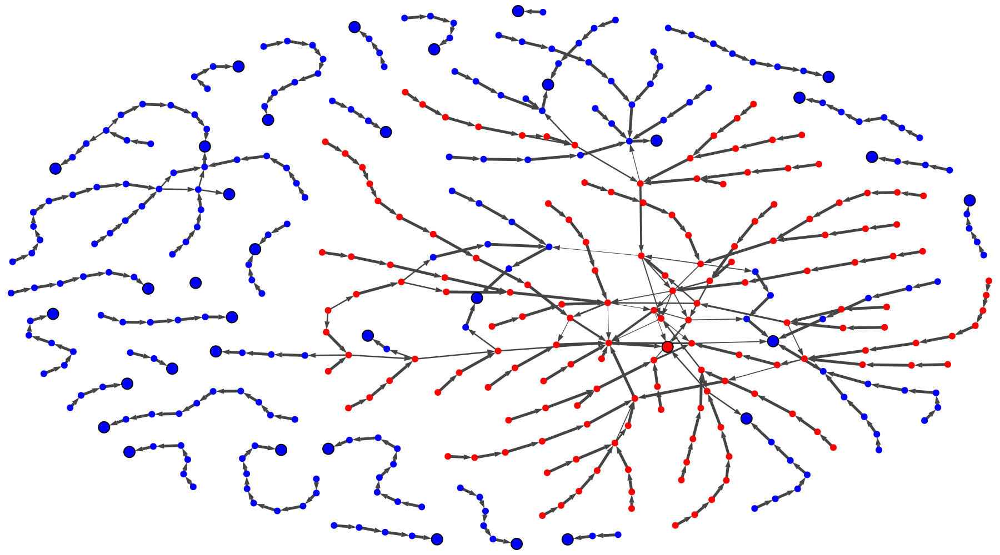

graphs/bays29_1_1.png


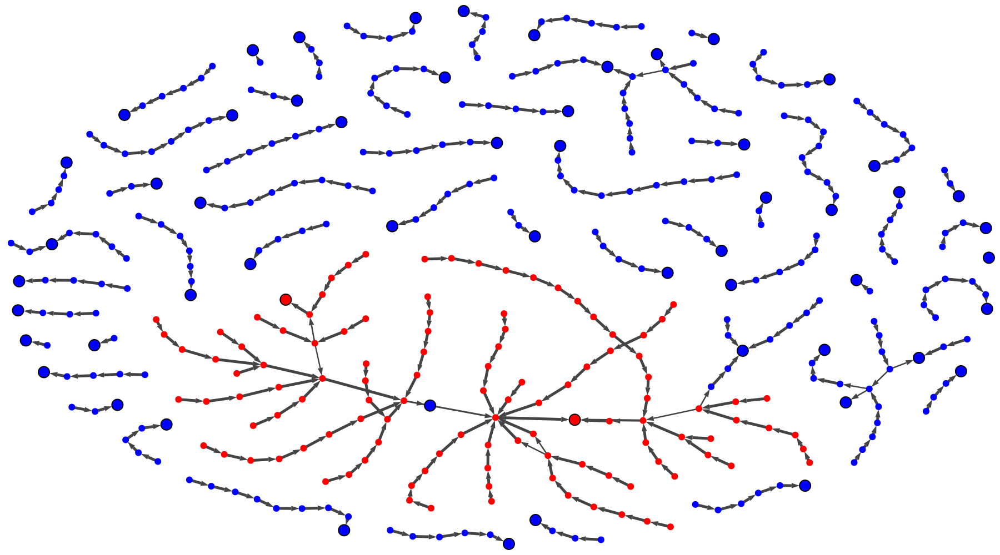

graphs/bays29_1_2.png


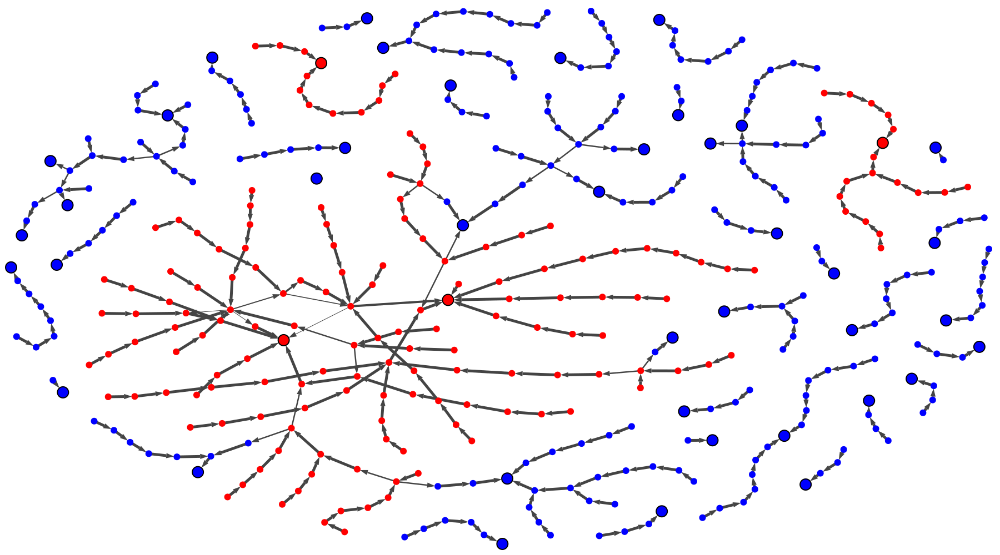

graphs/bays29_1_3.png


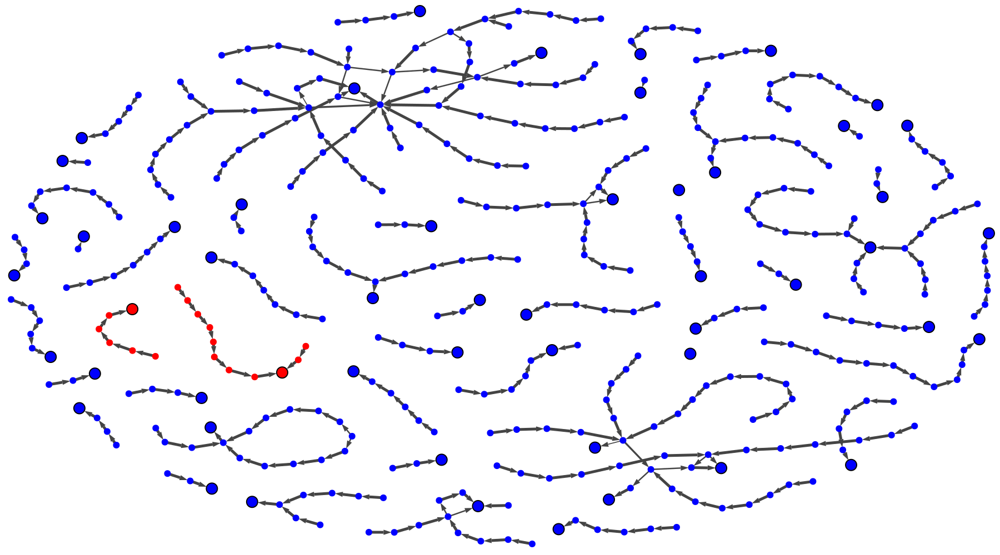

graphs/bays29_1_4.png


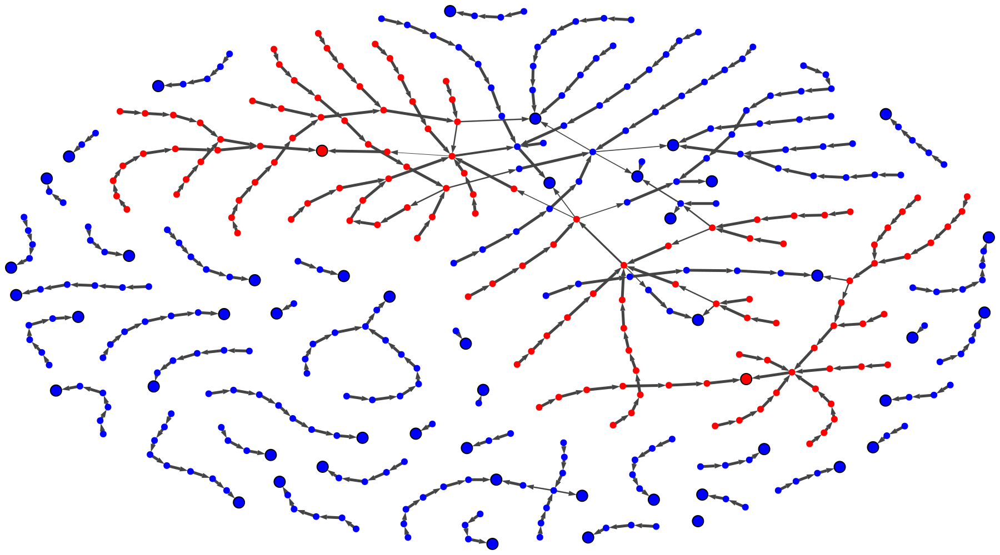

graphs/bays29_1_5.png


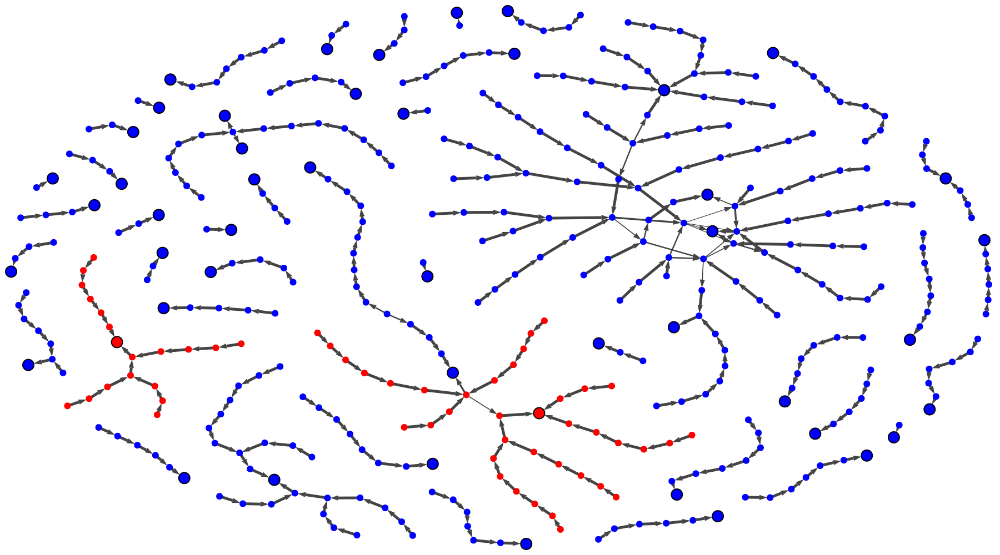

graphs/bays29_1_6.png


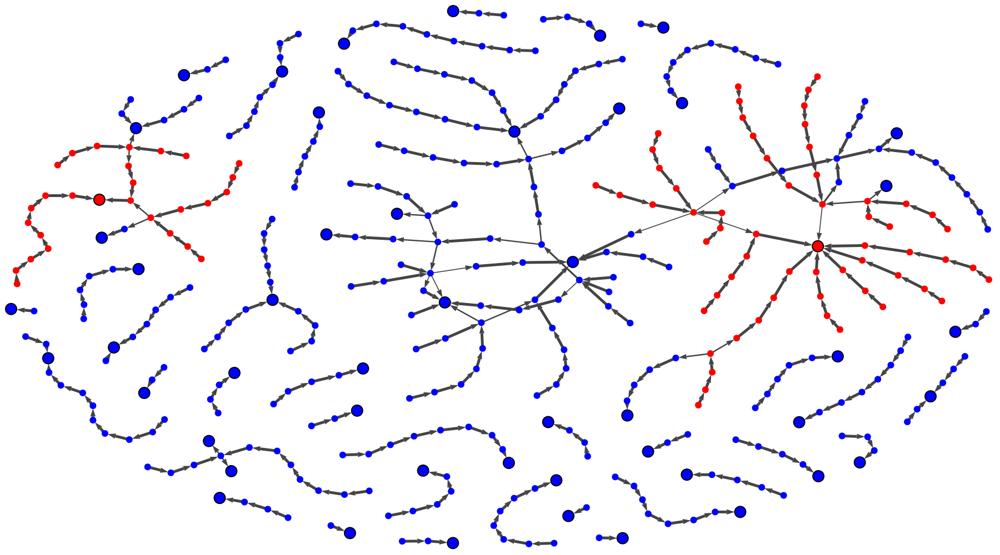

graphs/bays29_1_7.png


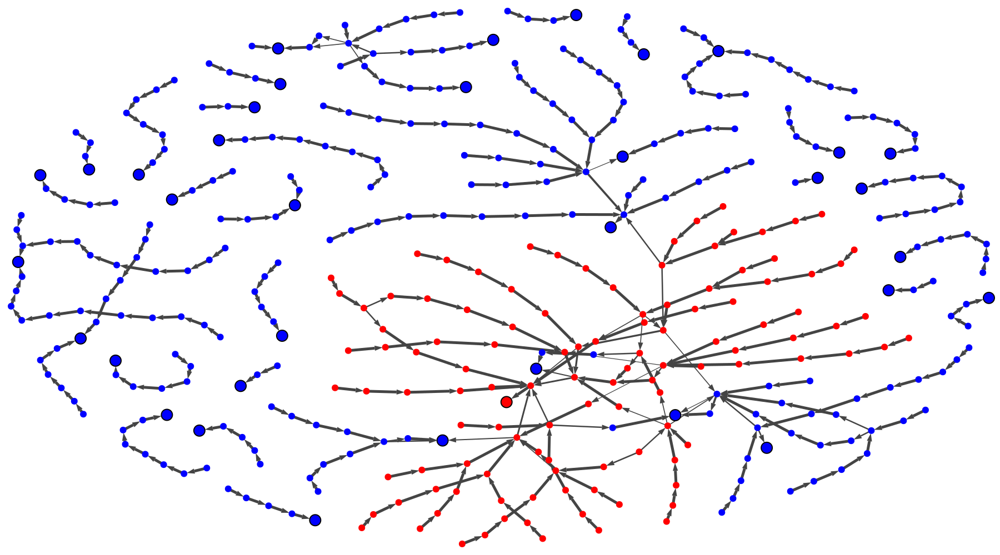

graphs/bays29_1_8.png


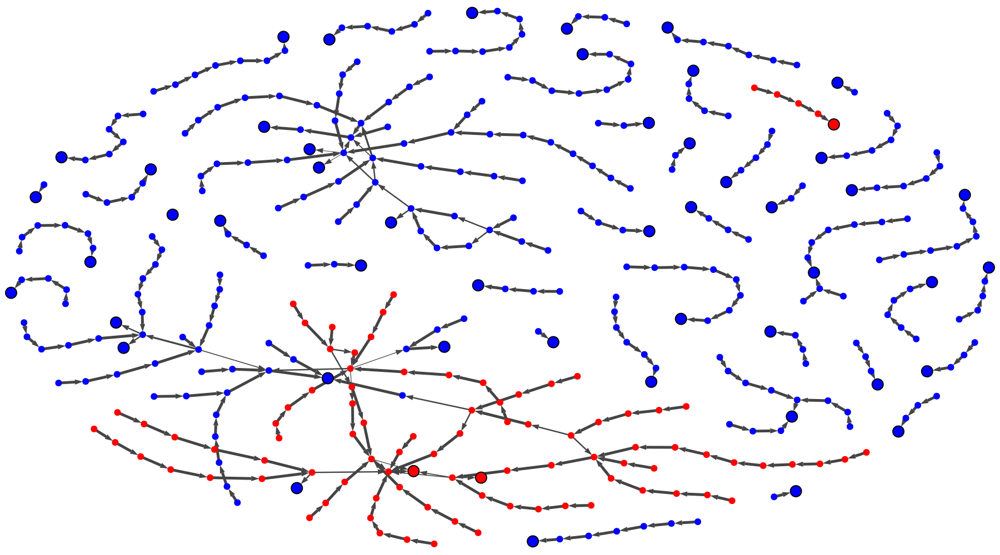

graphs/bays29_2_0.png


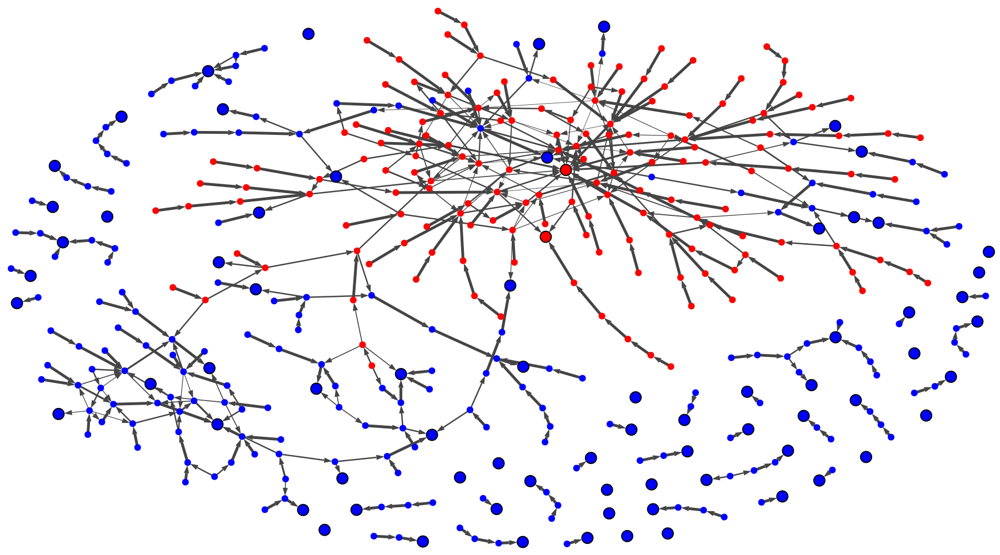

graphs/bays29_2_1.png


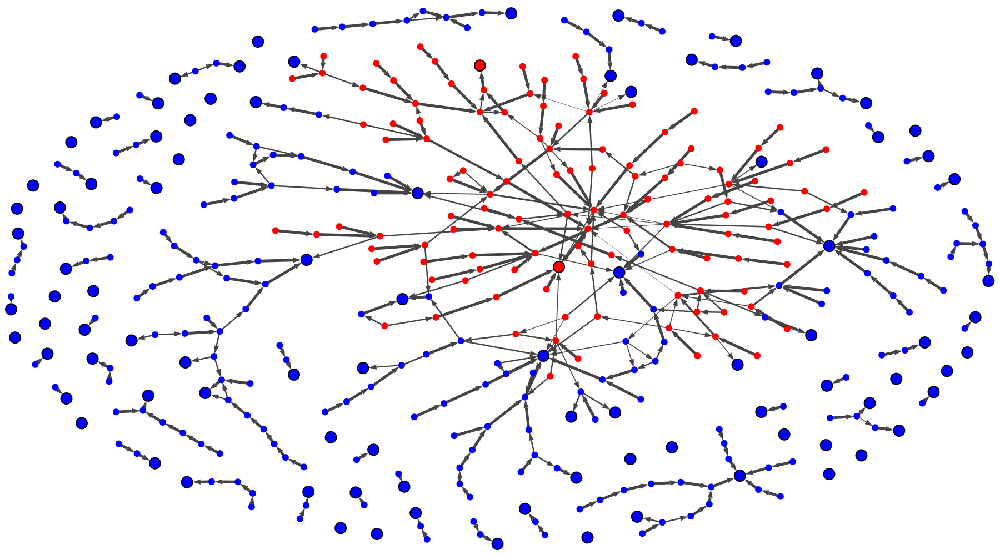

graphs/bays29_2_2.png


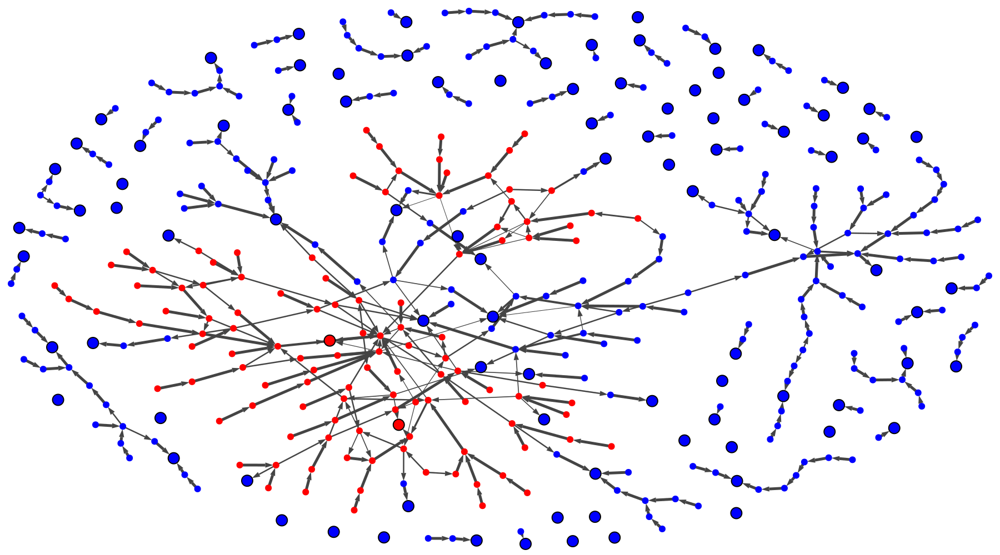

graphs/bays29_2_3.png


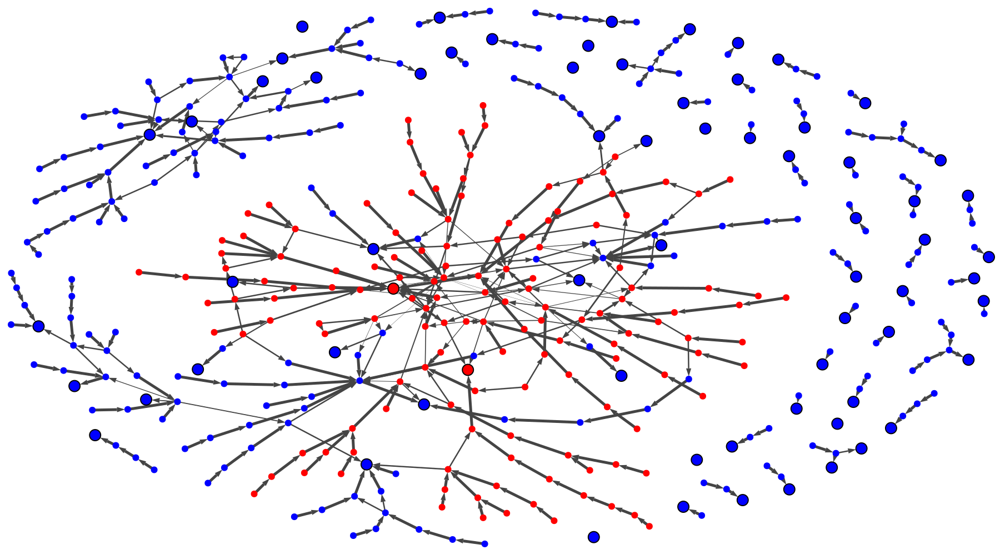

graphs/bays29_2_4.png


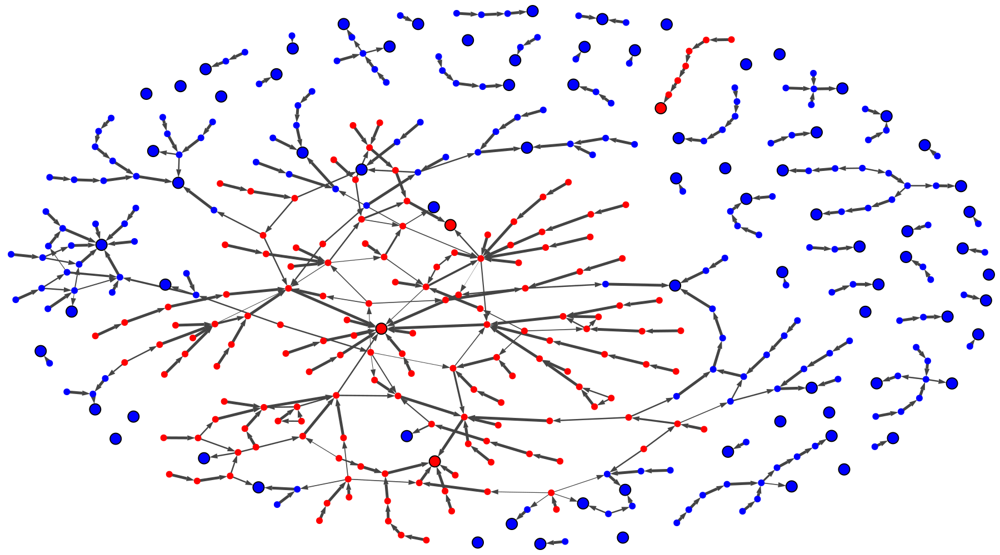

graphs/bays29_2_5.png


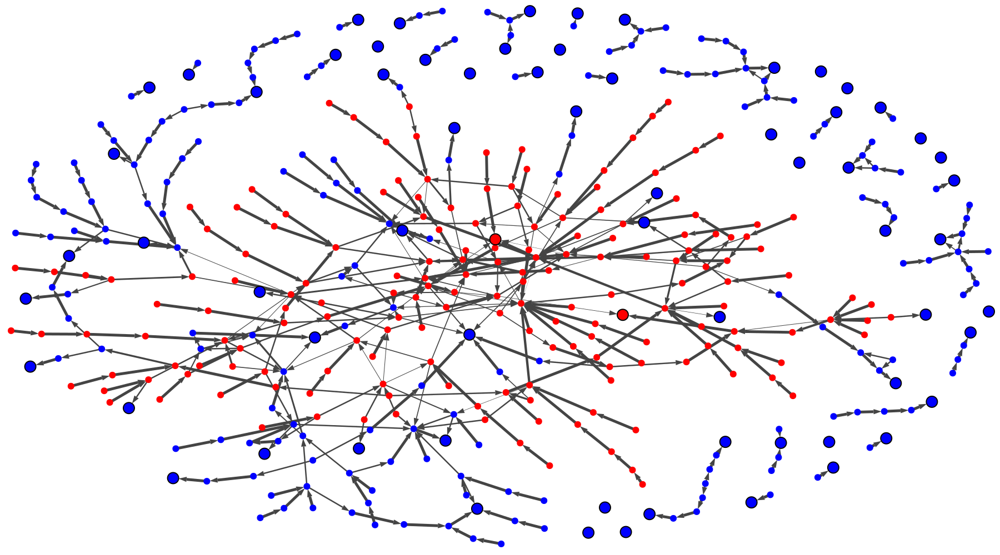

graphs/bays29_2_6.png


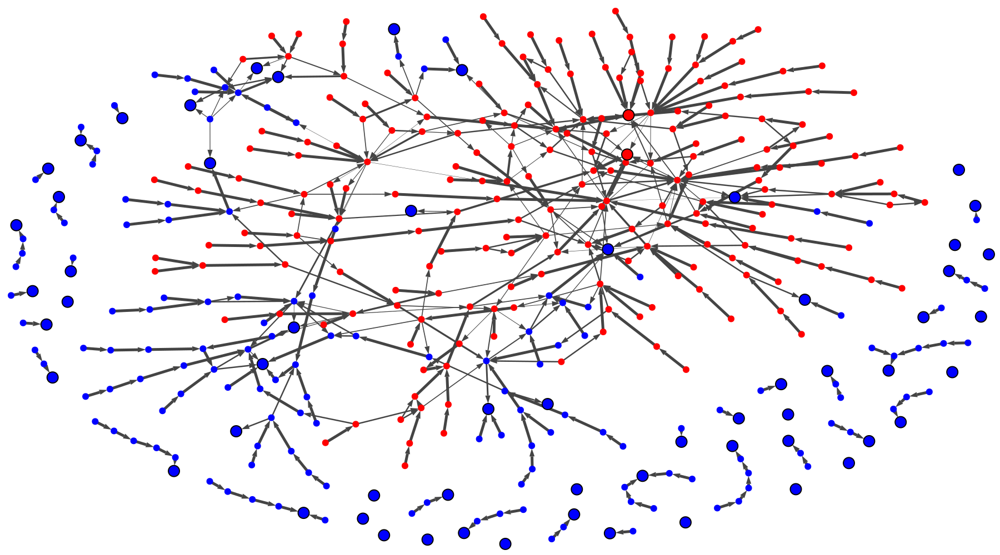

graphs/bays29_2_7.png


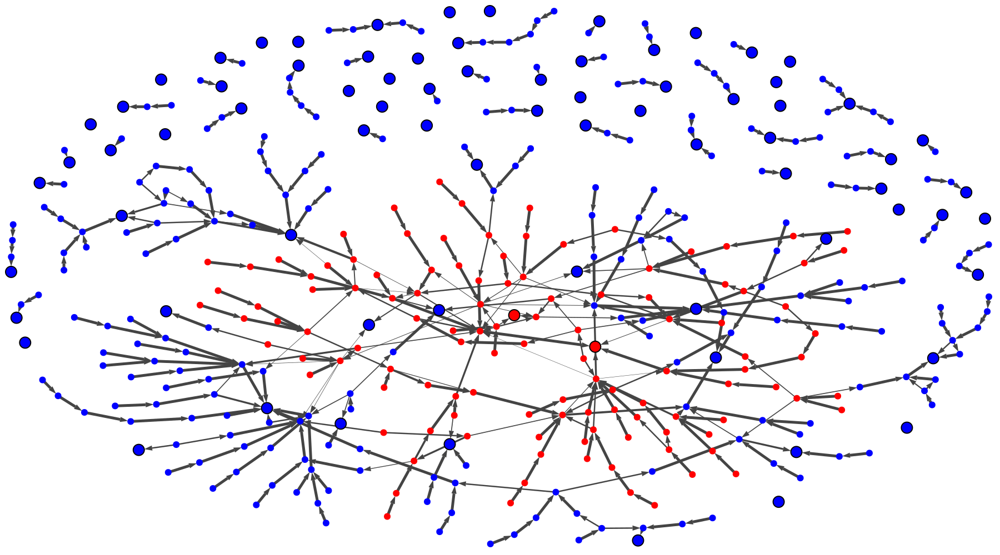

graphs/bays29_2_8.png


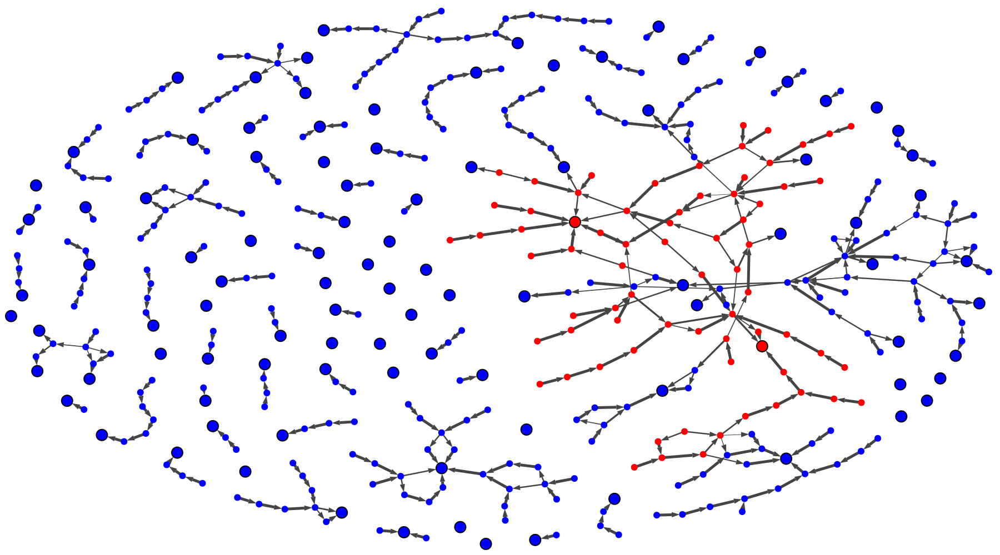

graphs/bays29_5_0.png


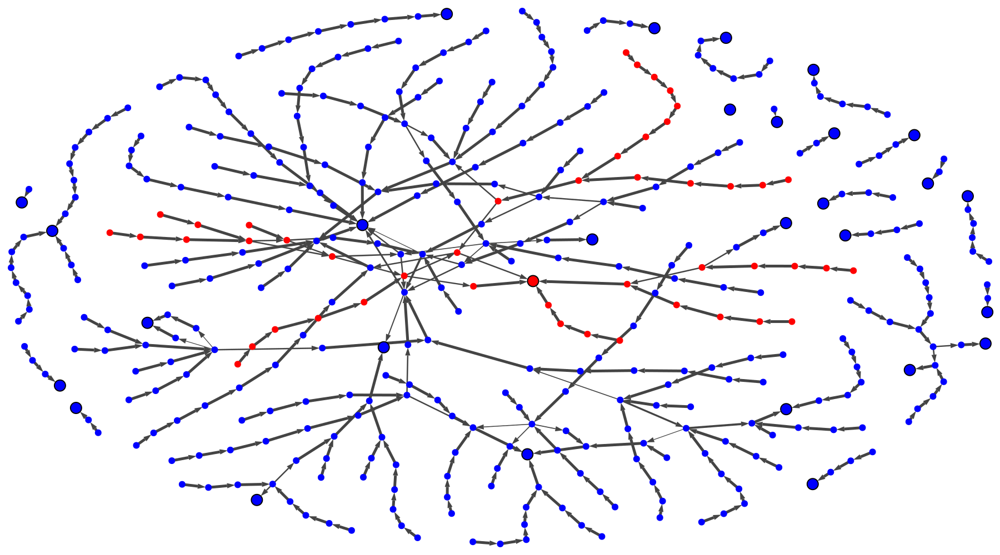

graphs/bays29_5_1.png


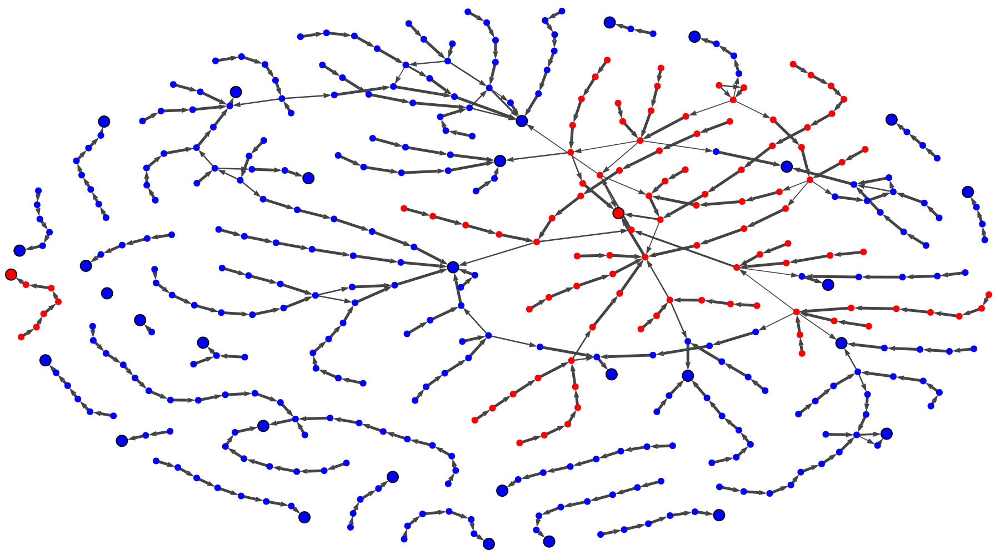

graphs/bays29_5_2.png


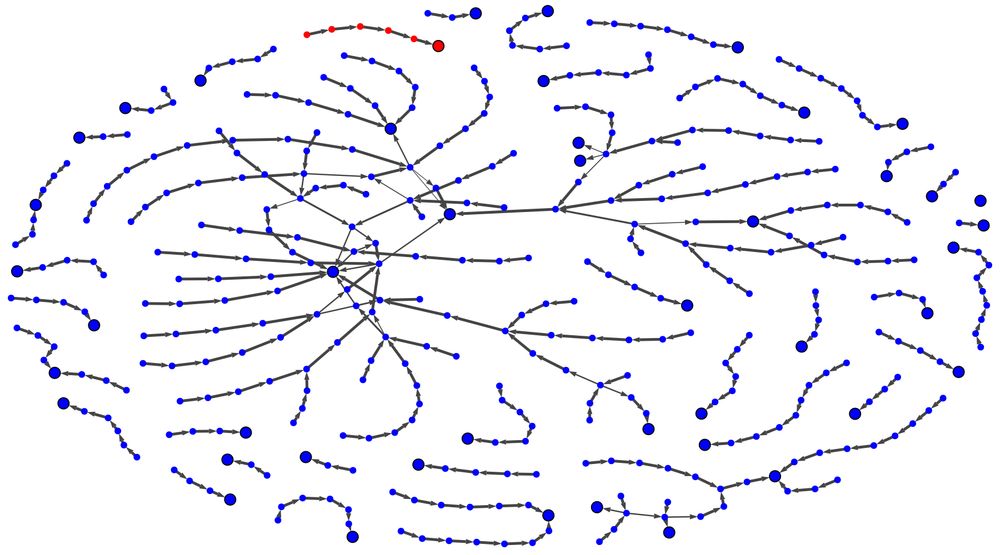

graphs/bays29_5_3.png


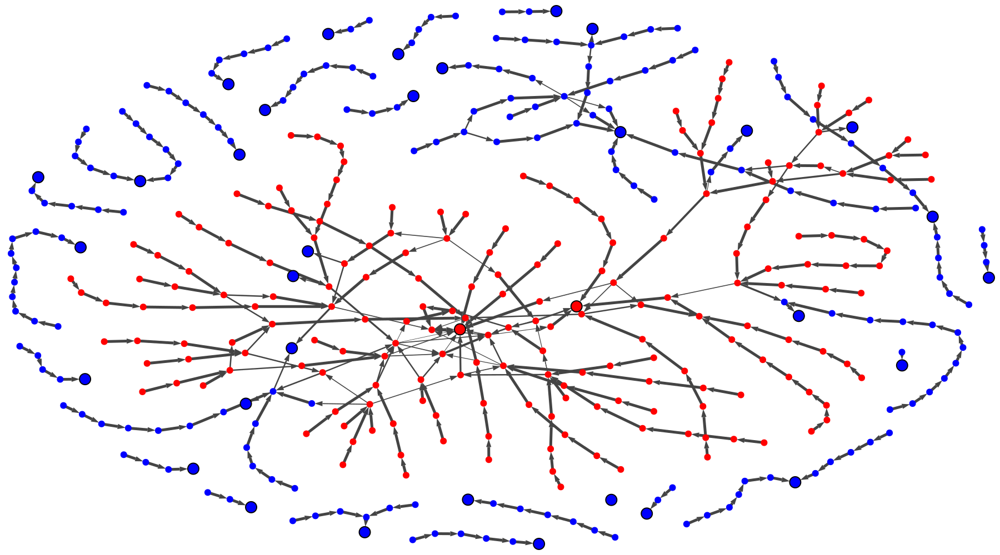

graphs/bays29_5_4.png


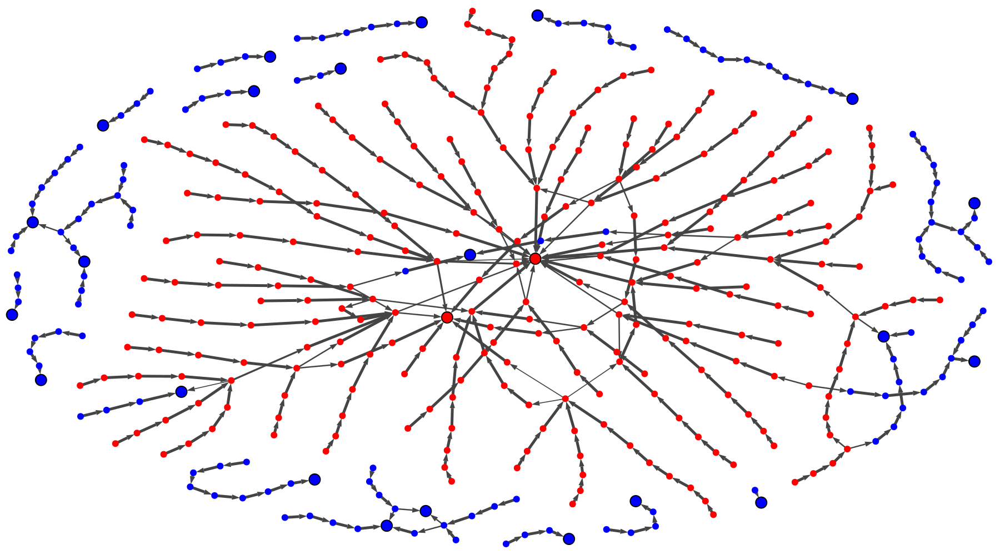

graphs/bays29_5_5.png


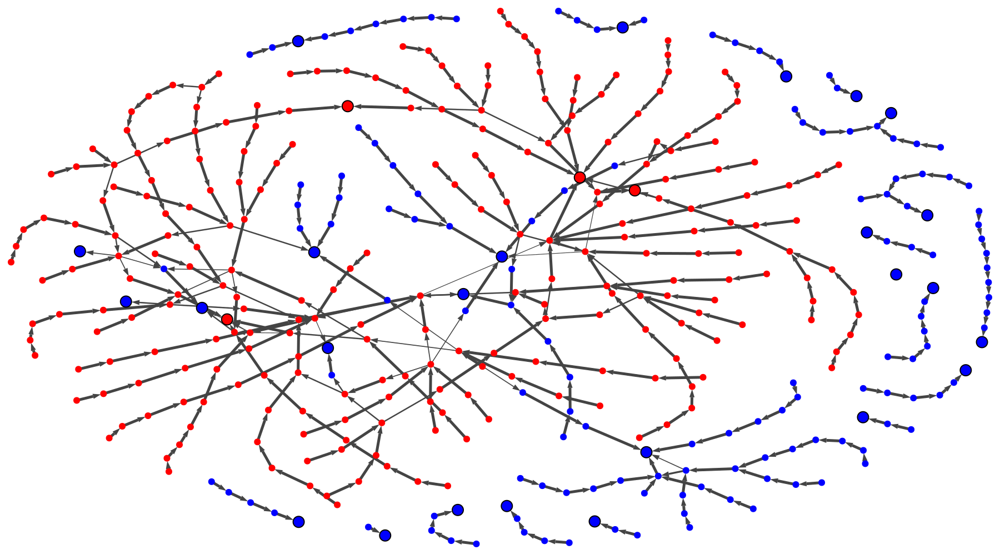

graphs/bays29_5_6.png


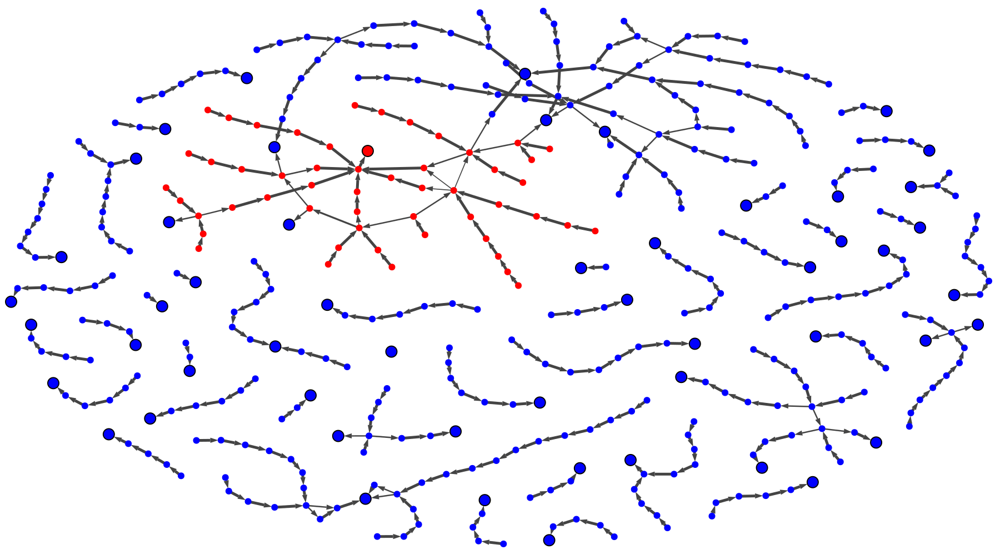

graphs/bays29_5_7.png


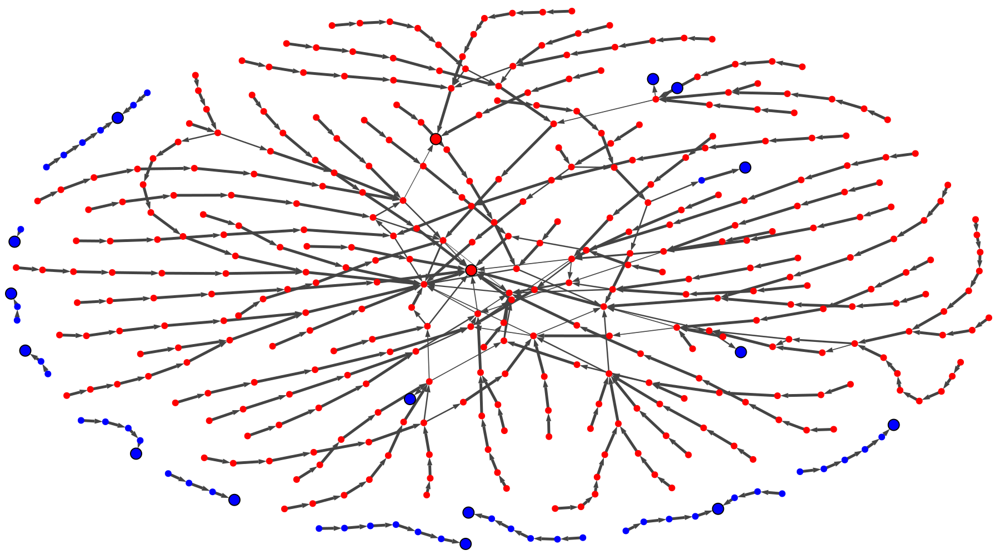

graphs/bays29_5_8.png


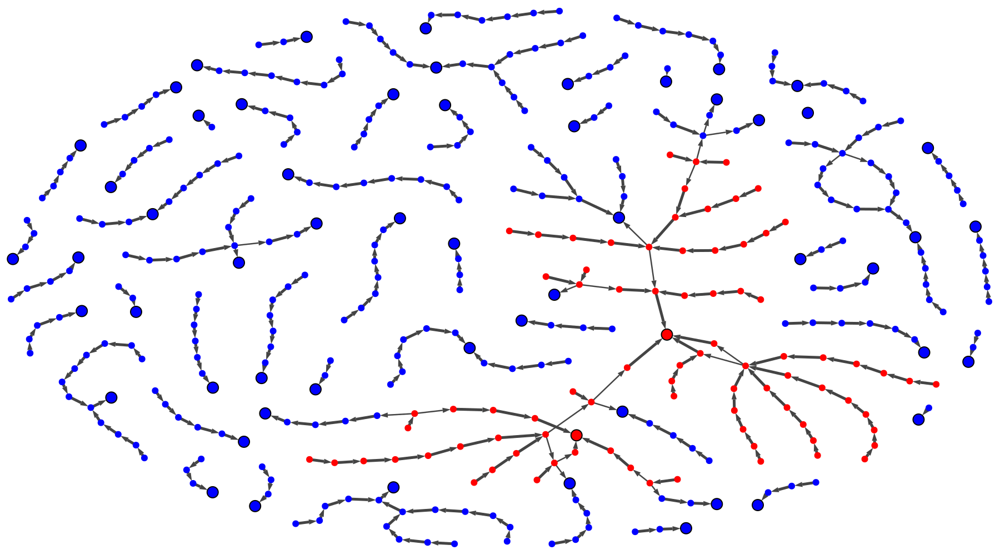

graphs/bays29_5_9.png


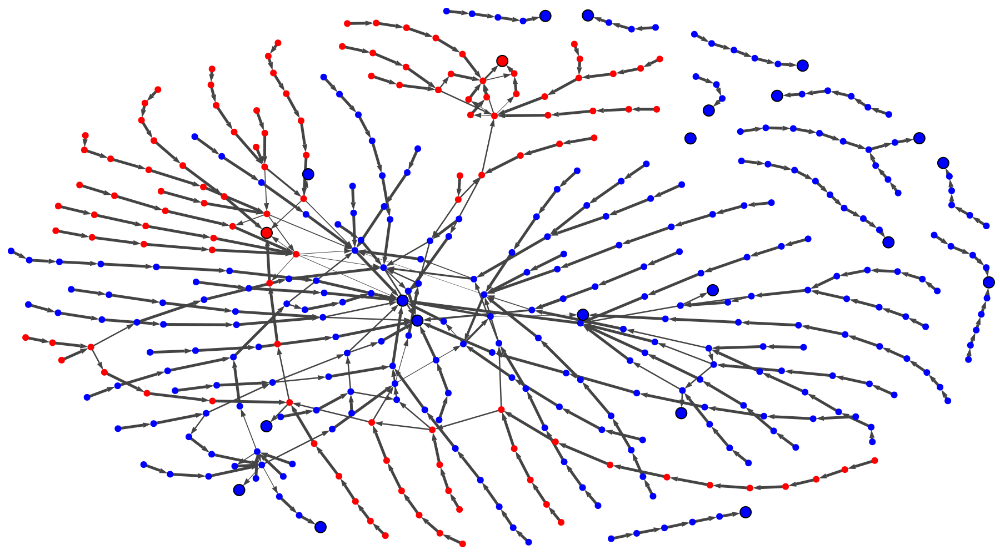

In [39]:
print_subs("graphs/bays29", 9, 1)
print_subs("graphs/bays29", 9, 2)
print_subs("graphs/bays29", 10, 5)

## 5.0 Conclusions and Perspectives

### 5.1 Conclusions

Most of subinstances graphs are not only diffrent from the main instance graph, but also from each other. Subinstances N-1 and N-5 show that difficulty of subinstances may vary.
Problems bays29_1_3 and bays29_5_2 turned out to be really hard for Chained-LK, 
whereas problems bay29_1_0 and bays29_5_7 seem to be easy, as many starting permutations converge to global optimum. This diversity of graphs suggests that no certain information about subinstances can be acquired from main instance graph. 

### 5.2 Possible extensions
* calculate and compare graphs performance and network metrics [1]
* compare graphs created by Chained-LK with diffrent K parameter.
* check whether there exist some correspondence between vertexes of diffrent instances graphs.

## References
[1] How Perturbation Strength Shapes the Global Structure of TSP Fitness Landscapes <br/>
Paul McMenemy, Nadarajen Veerapen, Gabriela Ochoa <br/>
Computing Science and Mathematics, University of Stirling, Stirling, UK <br/>
https://www.stir.ac.uk/research/hub/publication/25347

[2] An Effective Heuristic Algorithm for the Traveling-Salesman Problem <br/>
Lin, Shen; Kernighan, B. W. (1973) <br/>
Operations Research. 21 (2): 498–516<br/>
doi:10.1287/opre.21.2.498.

[3] Lin-Kernighan Heuristic Adaptations for the Generalized Traveling Salesman Problem <br/>
D. Karapetyana, G. Gutina <br/>
Royal Holloway London University, Egham, Surrey, TW20 0EX, United Kingdom <br/>
https://arxiv.org/pdf/1003.5330.pdf

[4] http://elib.zib.de/pub/mp-testdata/tsp/tsplib/tsp/bays29.tsp

[5] Gábor Csárdi, Tamás Nepusz: The igraph software package for complex network research. InterJournal Complex Systems, 1695, 2006.

[6] Graph Drawing by Force-Directed Placement <br/>
Fruchterman, Thomas M. J.; Reingold, Edward M. (1991) <br/>
Software – Practice & Experience, Wiley, 21 (11): 1129–1164 <br/>
doi:10.1002/spe.4380211102.